This notebook tackles the [**Playground Series – Season 6, Episode 7: Predicting Student Health Risk**](https://www.kaggle.com/competitions/playground-series-s6e7), a competition focused on predicting a class label (`at-risk`, `unhealthy`, `fit`) for the `class` target, based on features describing sleep duration, heart rate, BMI, calorie expenditure, step count, exercise duration, water intake, and lifestyle variables.


## The Approach


I plan to split the various phases of model development into separate notebooks to streamline later work (EDA can be *time consuming*), and allow conducting multiple studies at one time.  We will follow a structured machine learning workflow across several notebooks:

1.  **Exploratory Data Analysis (EDA):** We will begin by conducting a deep dive into the dataset using `sweetviz` and custom visualizations. This will help us understand the data's structure, identify patterns, analyze feature distributions, check for correlations, and assess overall data quality.  **(This notebook)**
    
2.  **Data Preprocessing & Feature Engineering:** Based on insights from the EDA, we will prepare the data for modeling. This will involve strategies like encoding categorical variables and splitting combined features to extract maximum predictive value.  A `FeatureEngineering` utility class will be created so that strategies can be shared among the various model notebooks.
    
3.  **Model Development & Tuning:** Once we have evaluated the data and performed feature engineering, we will build and train a robust predictive model. In past competitions, we've started with a **LightGBM** (Light Gradient Boosting Machine) model, renowned for its high performance and efficiency. We will also leverage **Optuna** for automated hyperparameter tuning to find the best-performing model configuration.  In the last competition, I also added notebooks to train **XGBoost** and **CatBoost** models.  I will also develop a model-blending notebook to blend the predictions, which provided the best scores.
    
4.  **Submission:** Finally, we will use our tuned model to generate predictions on the test set and format them into a `submission.csv` file for the competition.
    
Let's begin by loading the necessary libraries and exploring the data.


## Install Needed Packages


In [1]:
%pip -q install --upgrade sweetviz


Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import sys
import math
import random
import warnings
from pathlib import Path
from typing import Iterable
from IPython.display import display, Markdown, IFrame

# --- Third-party
import numpy as np
import pandas as pd
import sweetviz as sv
from IPython.display import display
import scipy.stats as st
from scipy.stats import ks_2samp
import matplotlib.pyplot as plt
import seaborn as sns

from ps_s06e07_experiment_setup import ExperimentSetup
from ps_s06e07_data_visualization import DataVisualizer

# --- Notebook settings
warnings.filterwarnings('ignore')

%matplotlib inline


In [3]:
helper = ExperimentSetup()

# Get the seed, and apply it to all the internals like pandas and numpy
seed = helper.set_seeds()

helper.configure_pandas()
helper.suppress_warnings()

# The target feature
TARGET = 'health_condition'

# Show GPU be utilized in training
USE_GPU = True


Random seed set to: 10301
Warnings suppressed.


## Read and Examine the Training Dataset


In [4]:
training_df = helper.read_dataset('training')


TRAINING DATASET

   id health_condition  sleep_duration  heart_rate    bmi  \
0   0        unhealthy           5.220      70.600 25.660   
1   1          at-risk           5.530      71.300 25.840   
2   2        unhealthy           5.290      75.400 24.540   
3   3        unhealthy           4.700      77.200 23.130   
4   4          at-risk           7.230      73.400 28.440   

   calorie_expenditure  step_count  exercise_duration  water_intake diet_type  \
0            2,174.000   1,326.000             19.800         1.860       veg   
1            1,966.000   9,891.000             49.900         1.260   non-veg   
2            2,688.000  14,216.000             38.100         1.600       veg   
3            2,630.000   7,174.000             59.900         2.020       veg   
4            2,560.000   6,584.000             46.000         2.250       veg   

  stress_level sleep_quality physical_activity_level smoking_alcohol  gender  \
0         high       average               seden

## Read and Examine the Test Dataset


In [5]:
test_df = helper.read_dataset('test')


TEST DATASET

       id  sleep_duration  heart_rate    bmi  calorie_expenditure  step_count  \
0  690088           5.350      64.900 23.480            2,745.000  14,167.000   
1  690089             NaN      83.100 22.420            1,773.000   6,801.000   
2  690090           6.680      59.700 24.140            3,040.000  13,250.000   
3  690091           7.130      78.500 26.260            2,494.000   6,331.000   
4  690092           5.490      77.700 23.290            1,828.000  13,894.000   

   exercise_duration  water_intake diet_type stress_level sleep_quality  \
0             59.500         1.860       veg         high          poor   
1             24.500         2.400  balanced         high          poor   
2             48.500         2.760  balanced       medium          poor   
3             56.900         2.340       veg          low          good   
4             39.400         2.450       veg         high       average   

  physical_activity_level smoking_alcohol gender

## Read and Examine the Original Dataset


In [6]:
original_df = helper.read_dataset('original')


ORIGINAL DATASET

   student_id            timestamp  sleep_duration  heart_rate    bmi  \
0        1102  2025-01-01 00:00:00           9.290      67.400 28.560   
1        1435  2025-01-01 01:00:00           9.330      57.200 30.170   
2        1860  2025-01-01 02:00:00           8.330      73.700 19.930   
3        1270  2025-01-01 03:00:00           5.600      61.900 22.020   
4        1106  2025-01-01 04:00:00           9.100      69.600 20.850   

   calorie_expenditure  step_count  exercise_duration  water_intake diet_type  \
0            2,113.000        5227             91.300         2.080       veg   
1            2,060.000       14460             67.000         2.570       veg   
2            2,236.000       14589             52.600         1.930   non-veg   
3            2,650.000       12618             55.200         2.970       veg   
4            1,985.000       14518             27.100         3.090   non-veg   

  stress_level sleep_quality physical_activity_level smo

## Exploratory Data Analysis

For automated EDA reporting, this notebook uses [`sweetviz`](https://github.com/fbdesignpro/sweetviz). An earlier iteration used `ydata_profiling`, but persistent dependency conflicts and waning maintenance made it impractical to keep in the stack. `sweetviz` is lightweight, actively maintained, and produces clean, self-contained HTML reports that can be viewed outside the notebook — from a browser, shared via GitHub, etc.

The reports generated below include histograms, summary statistics, most-frequent-value tables, and association plots. Crucially, the train/test comparison report makes it easy to spot distribution drift between the two splits — which directly informs which features to concentrate on during feature engineering.

Note that due to formatting issues, the iframe implementation doesn't work on Kaggle.  I still wanted to produce the HTML, so on Kaggle, the reports are created twice, once in HTML form, and another to be rendered within the notebook.


                                             |                                                                …


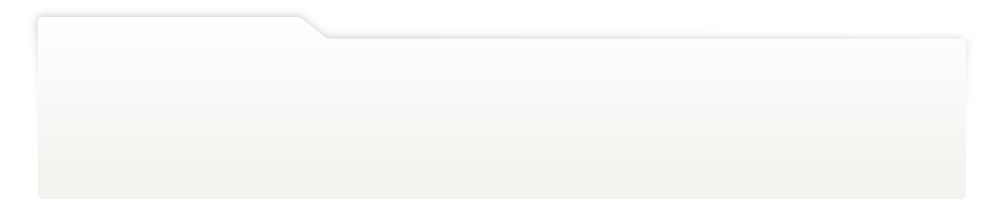
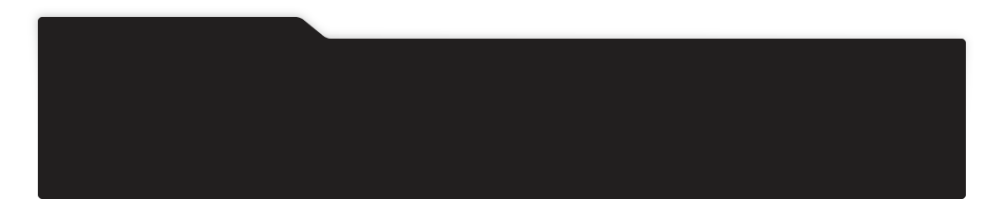
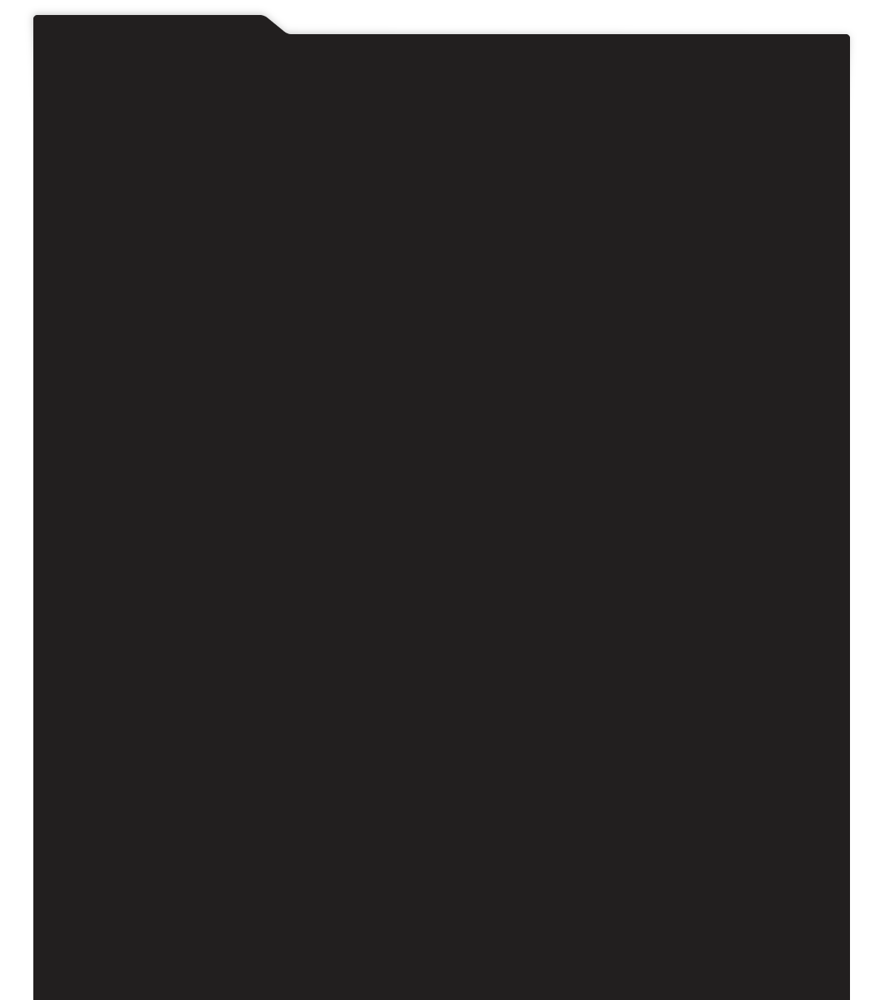
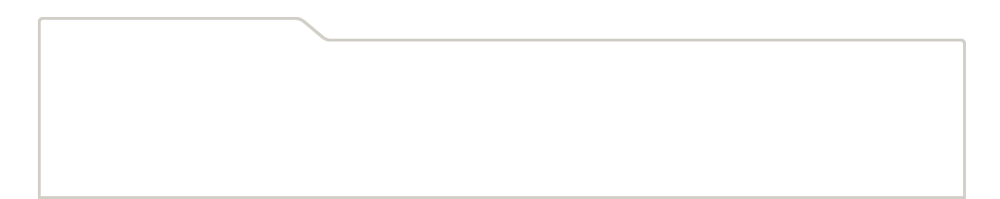
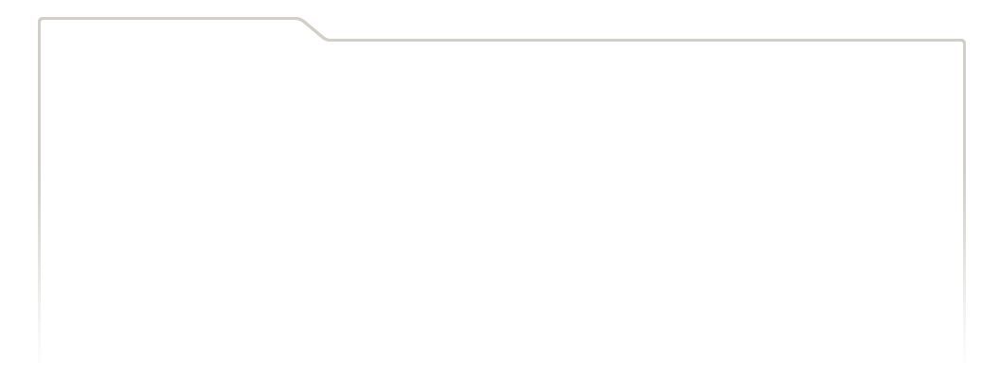
...
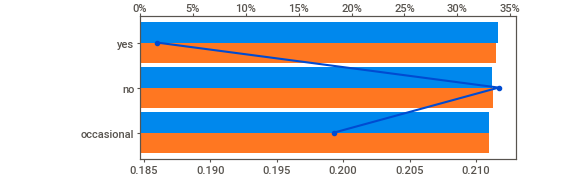
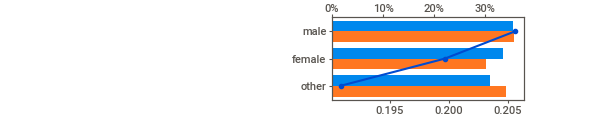
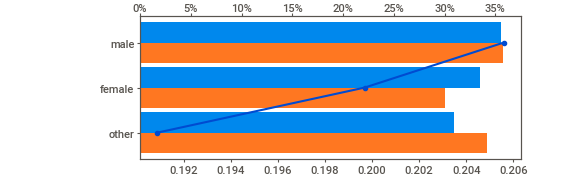
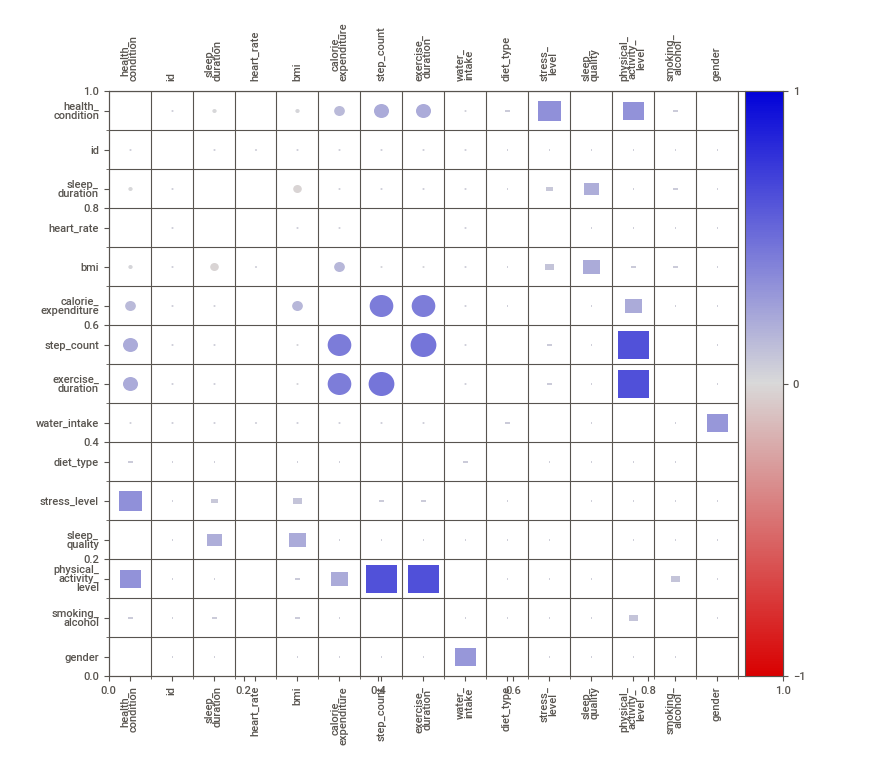
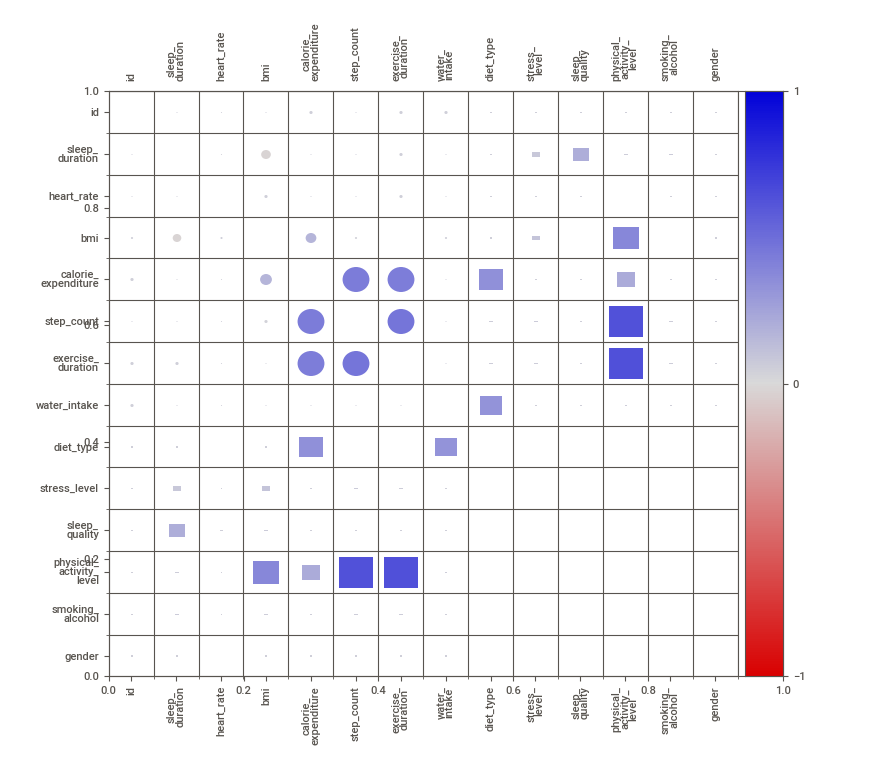

In [7]:
# Sweetviz can't handle categorical, so map the target to numeric
target_mapping = {'at-risk': 0, 'unhealthy': 1, 'fit': 2}

training_df_sv = training_df.copy()
training_df_sv[TARGET] = training_df_sv[TARGET].map(target_mapping).astype(np.int8)

# Tell sweetviz to treat the (now-integer) target as numerical, not categorical
feat_cfg = sv.FeatureConfig(force_num=[TARGET])

# Compare train vs test
train_test_comparison_report = sv.compare(
    [training_df_sv.drop(columns=["is_original"], errors="ignore"), "Training Data"],
    [test_df.drop(columns=["is_original"], errors="ignore"), "Test Data"],
    target_feat=TARGET,
    feat_cfg=feat_cfg
)
train_test_comparison_report.show_notebook(
    w="100%",
    h=700,
    layout='vertical'
)


We also load the original [College Student Health Behavior Dataset](https://www.kaggle.com/datasets/stephen-walter/college-student-health-behavior-dataset) to compare its distributions against the competition's synthetic training set. This helps reveal whether the synthetic data faithfully reproduces the source distribution or introduces artifacts that may affect generalization.


                                             |                                                                …


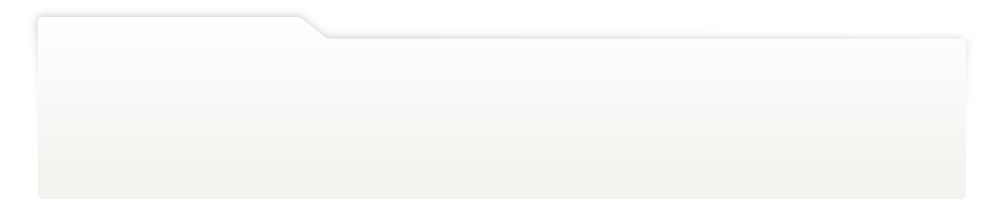
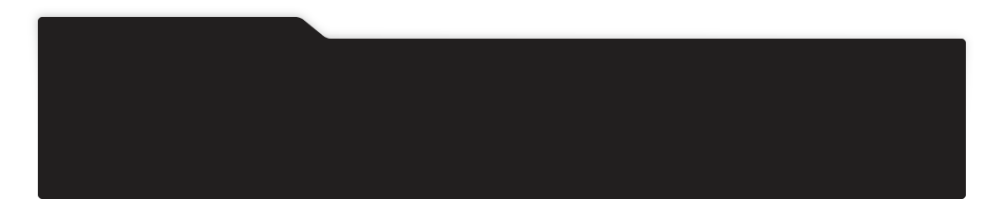
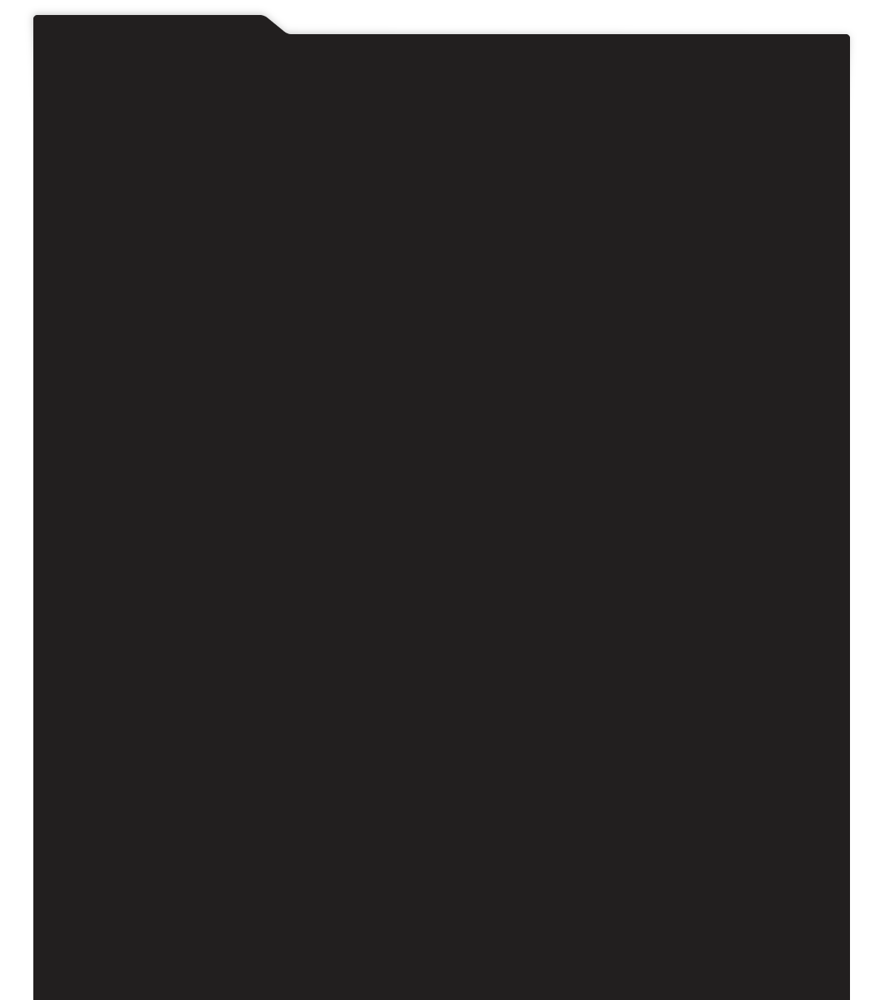
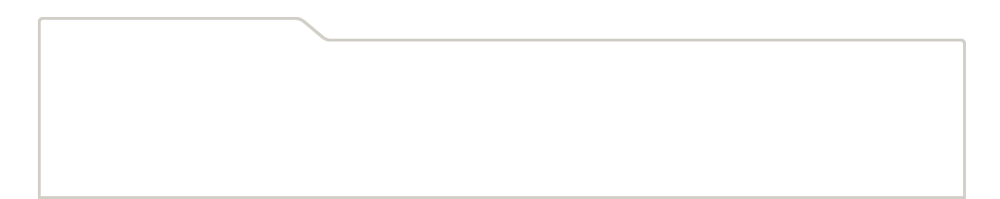
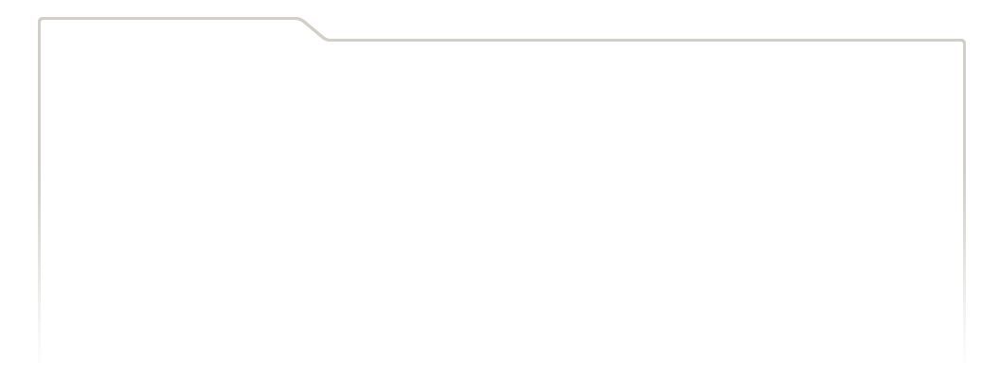
...
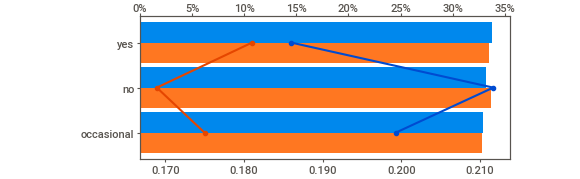
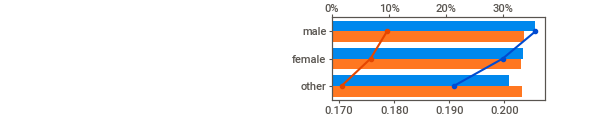
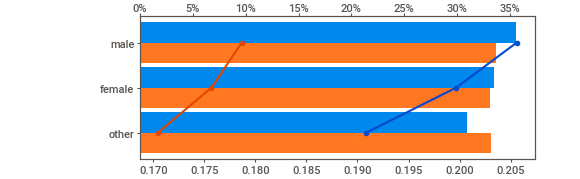
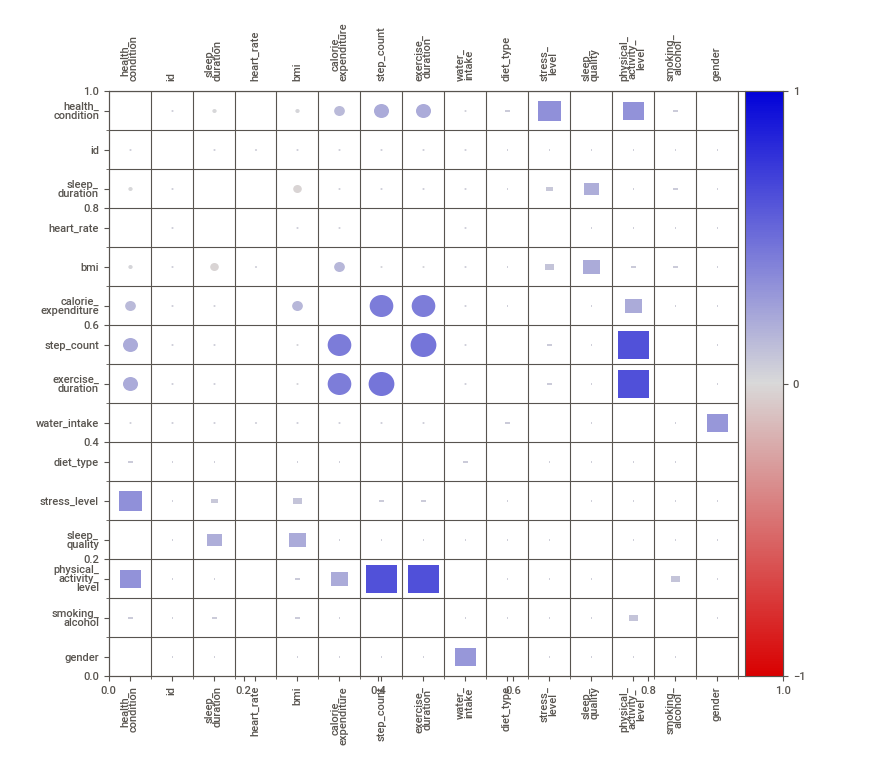
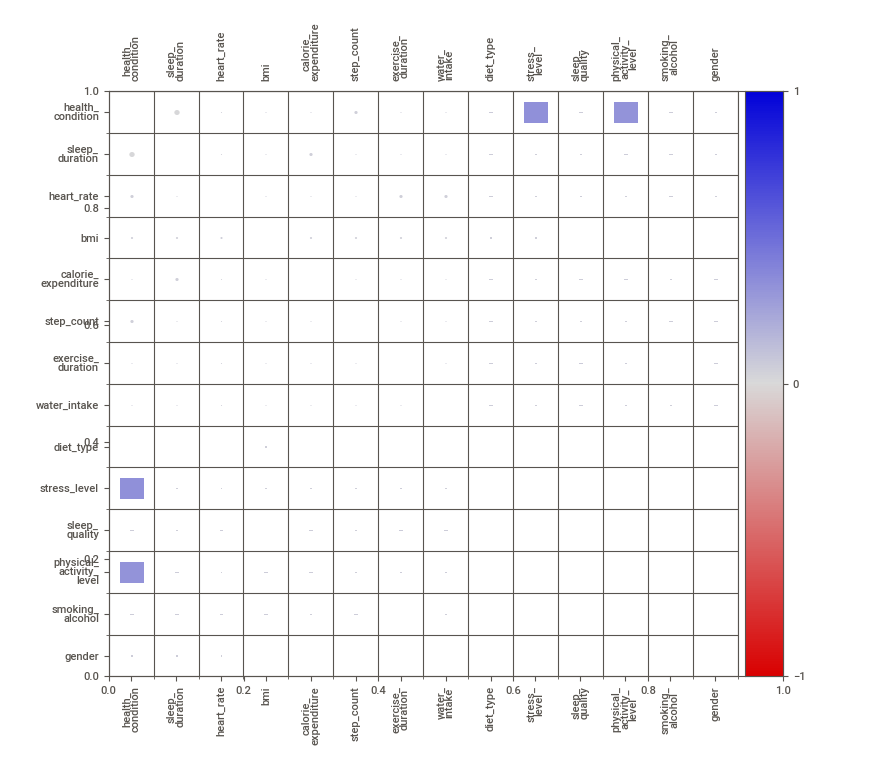

In [8]:
original_df_sv = original_df.copy()
original_df_sv[TARGET] = original_df_sv[TARGET].map(target_mapping).astype(np.int8)

# Compare train vs original
train_original_comparison_report = sv.compare(
    [training_df_sv.drop(columns=["is_original"], errors="ignore"), "Training Data"],
    [original_df_sv.drop(columns=["is_original"], errors="ignore"), "Original Data"],
    target_feat=TARGET,
    feat_cfg=feat_cfg
)
train_original_comparison_report.show_notebook(
    w="100%",
    h=700,
    layout='vertical'
)


In addition to the train/test comparison, `sweetviz` can generate a full standalone profile of the training data alone via `sv.analyze`. This report provides per-feature breakdowns of distributions, missing values, and correlations against the target.  This is useful to examine before introducing the test set into the picture.


                                             |                                                                …


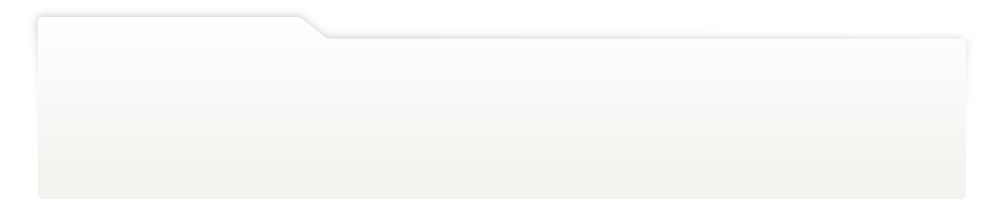
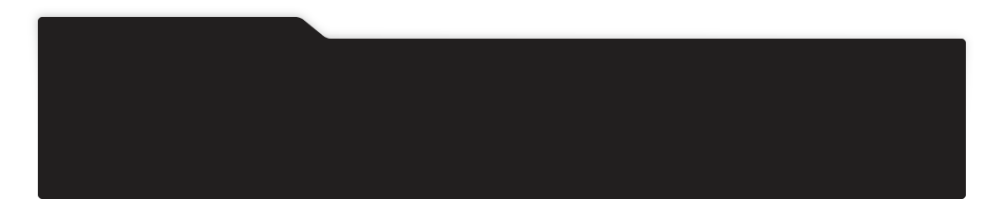
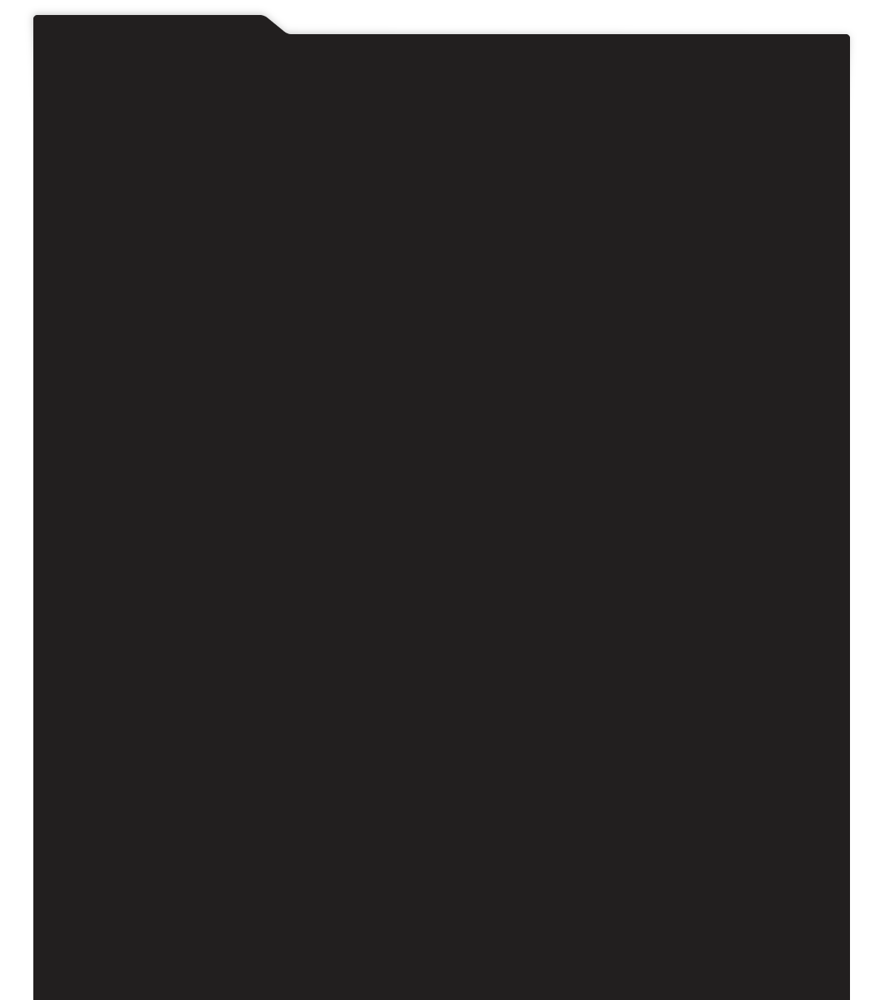
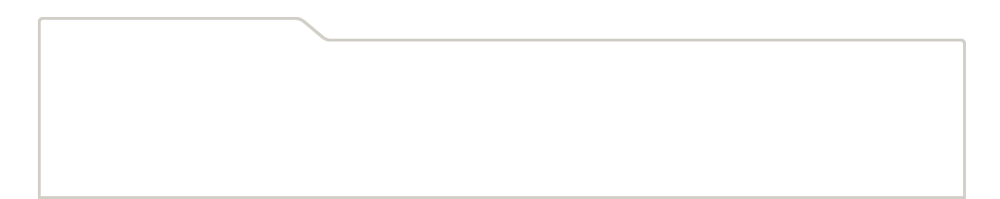
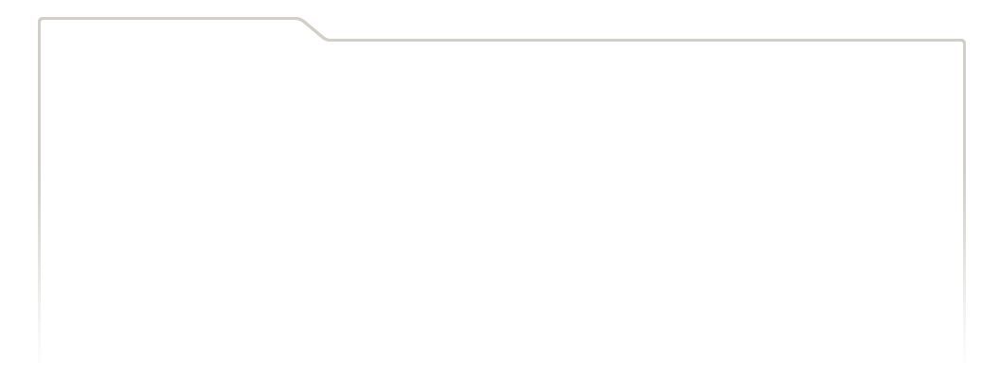
...
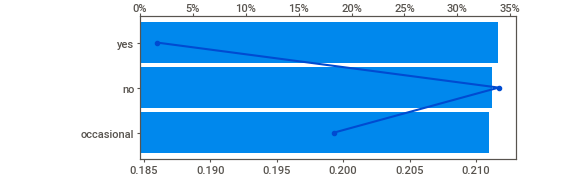
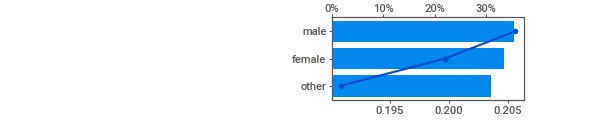
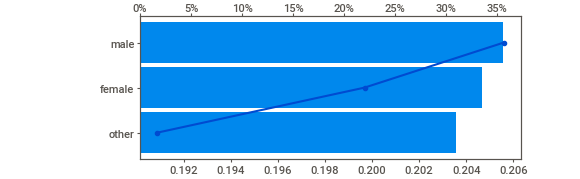
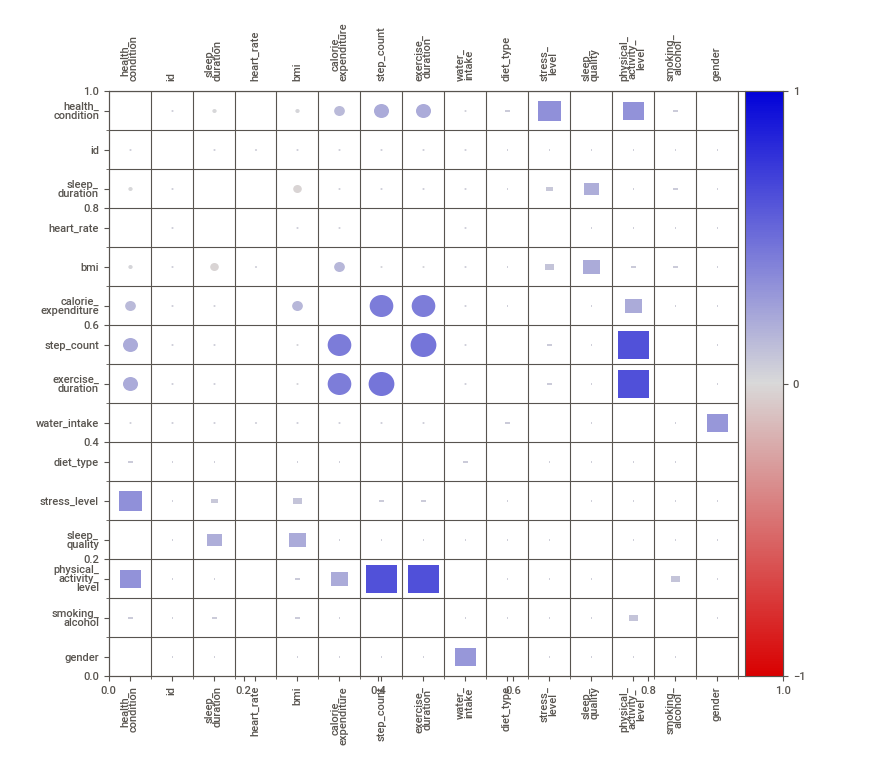
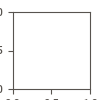

In [9]:
# Full profile of training data alone
training_report = sv.analyze(
    [training_df_sv.drop(columns=["is_original"], errors="ignore"), "Training Data"],
    target_feat=TARGET,
    feat_cfg=feat_cfg
)
training_report.show_notebook(
    w="100%",
    h=700,
    layout='vertical'
)


Finally, `sv.compare_intra` lets us compare two subsets of the training data against each other. Here we split on health condition membership, at-risk rows vs. all others, to surface which features carry the most discriminating signal between student health conditions. This is particularly informative for a three-class problem like this one, where understanding per-class feature separability guides both feature engineering and model selection.


                                             |                                                                …


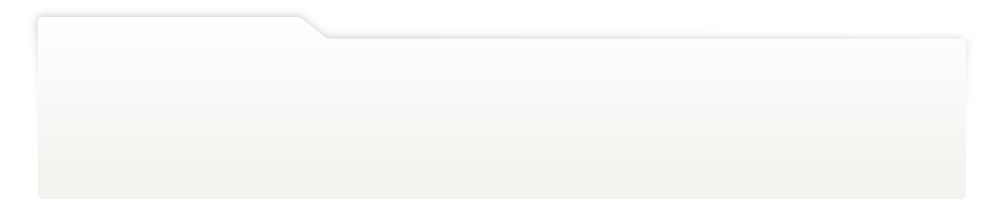
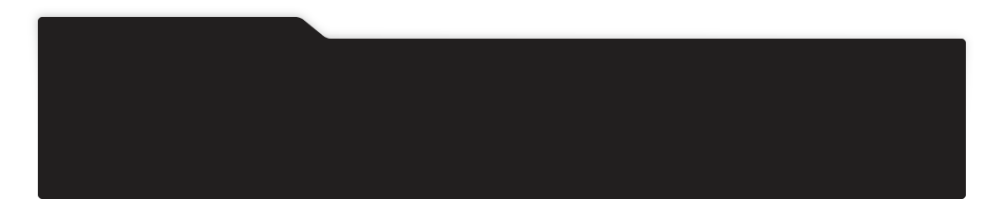
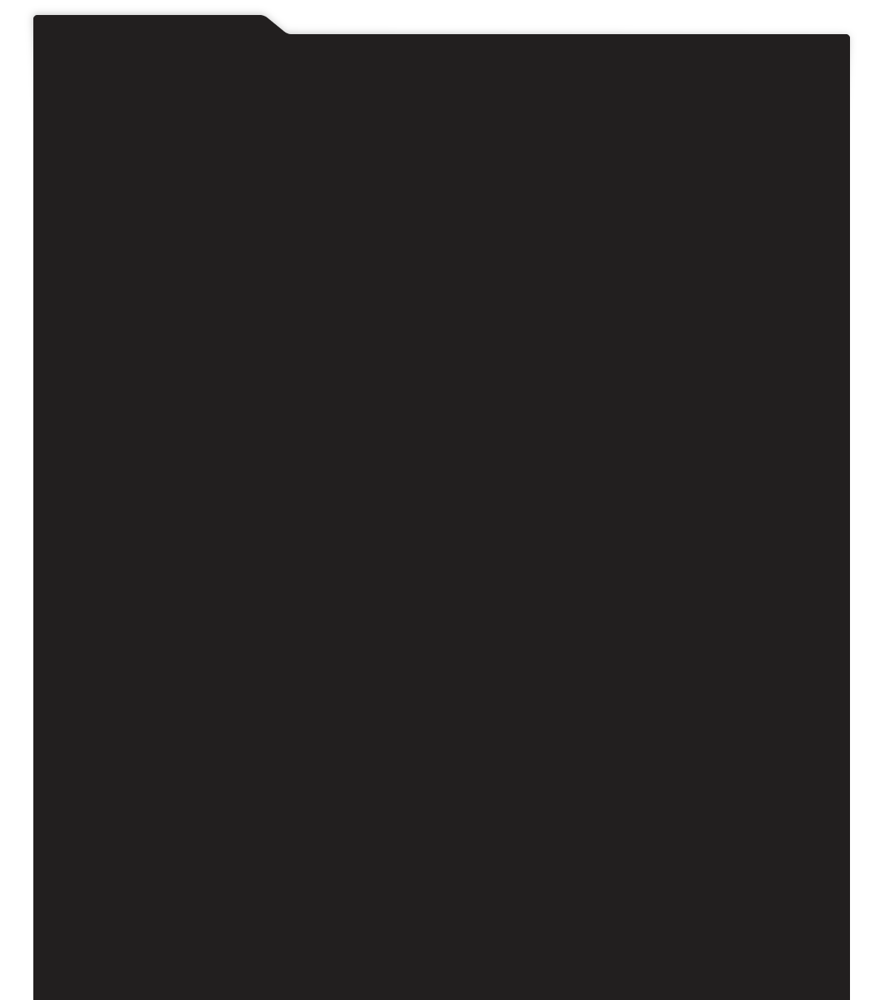
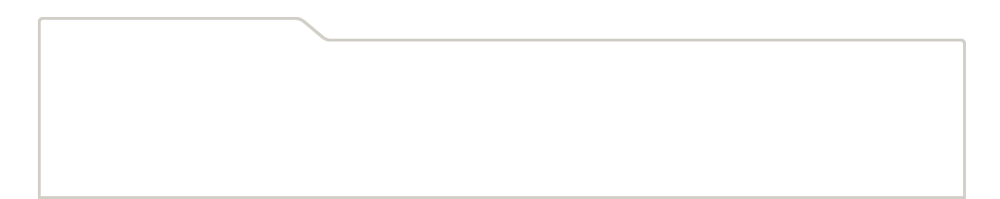
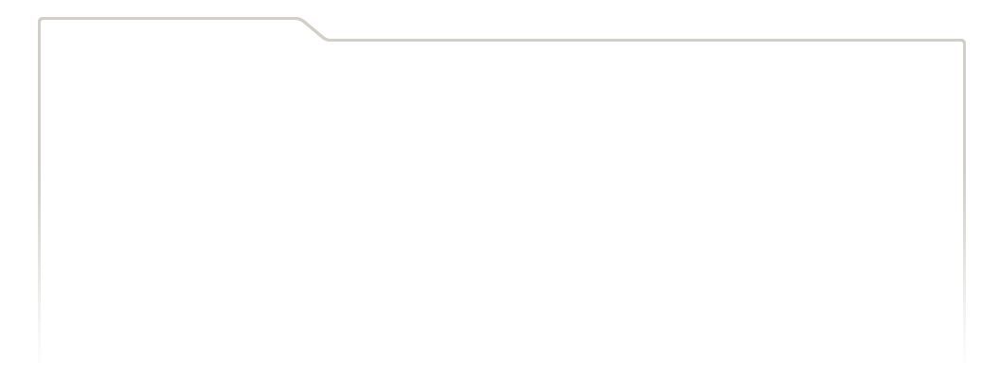
...
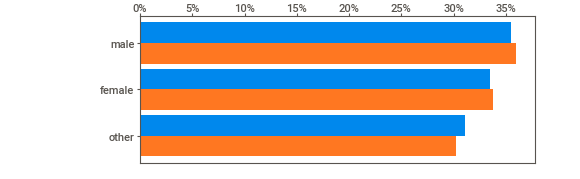
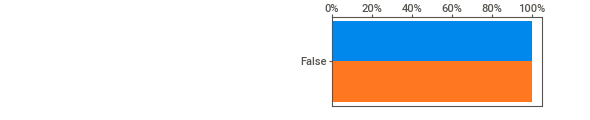
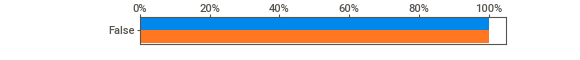
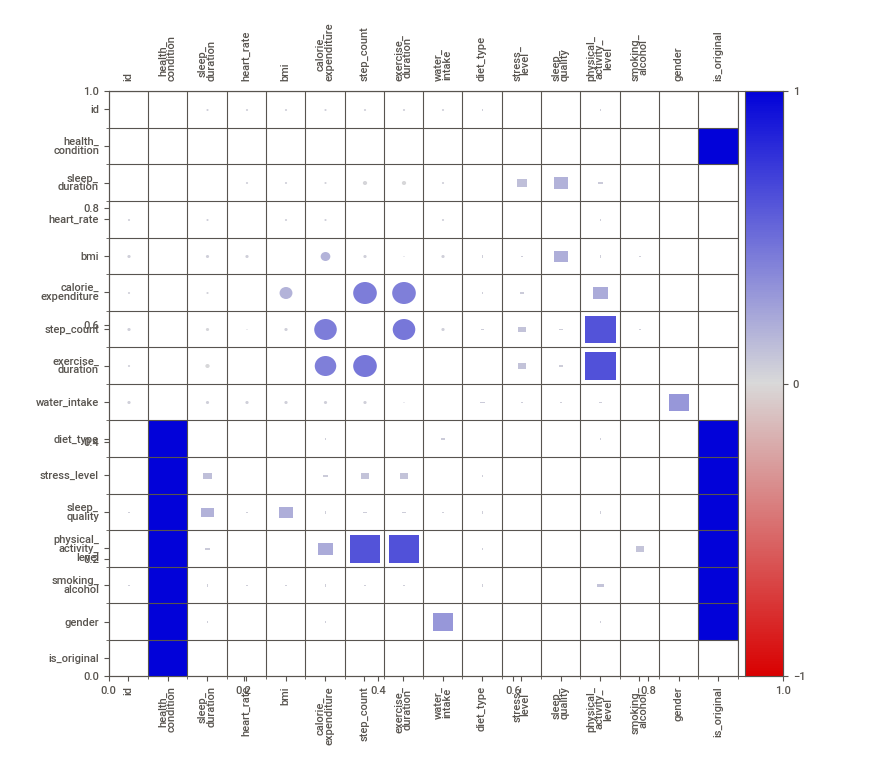
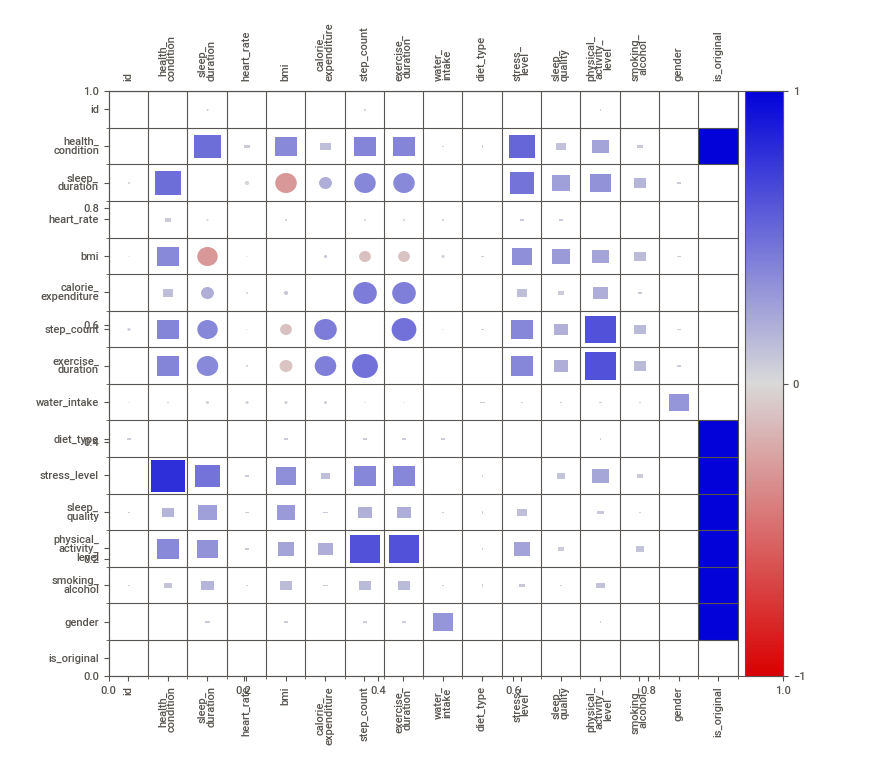

In [10]:
# Compare at-risk vs others within training data
atrisk_vs_others_report = sv.compare_intra(
    training_df,                          # use original string labels here
    training_df[TARGET] == 'at-risk',      # boolean mask for "left" split
    ["at-risk", "unhealthy / fit"],
    target_feat=None                       # no target needed for intra-compare
)
atrisk_vs_others_report.show_notebook(
    w="100%",
    h=700,
    layout='vertical'
)


## Data Visualization
While the automated `sweetviz` reports provide a broad overview, we use a custom `DataVisualizer` class to dig deeper into specific relationships.

1. **Target Encoding:** We convert the `class` target from `at-risk`, `unhealthy`, and `fit` to `0`, `1`, and `2`. This allows us to calculate mean target rates and Spearman correlations numerically.
2. **Signal Ranking:** We rank features by their Spearman correlation (for numerical features) and range of target rate (for categorical features) to identify the strongest predictors.
3. **Interaction Plots:** We generate specific plots to visualize how top features interact with the target across all three classes.


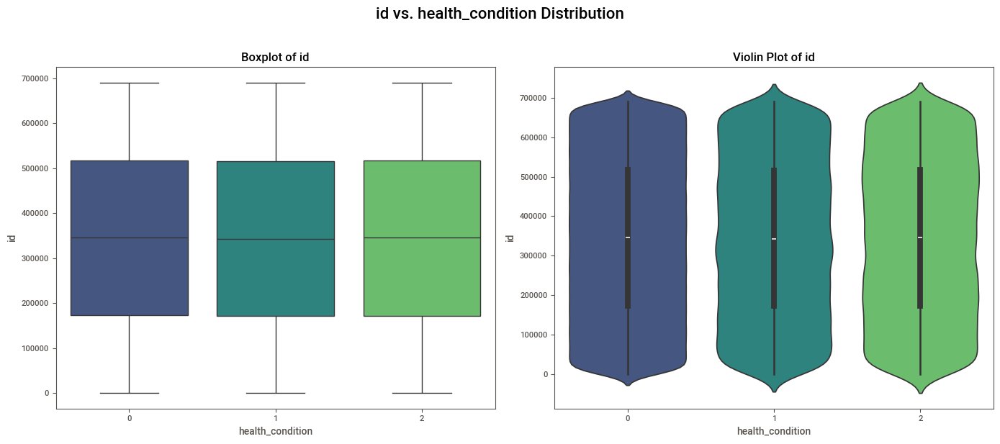

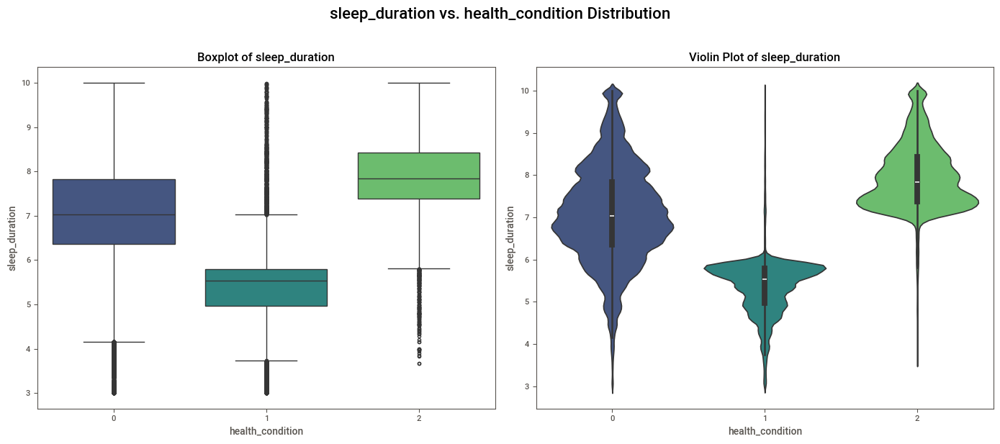

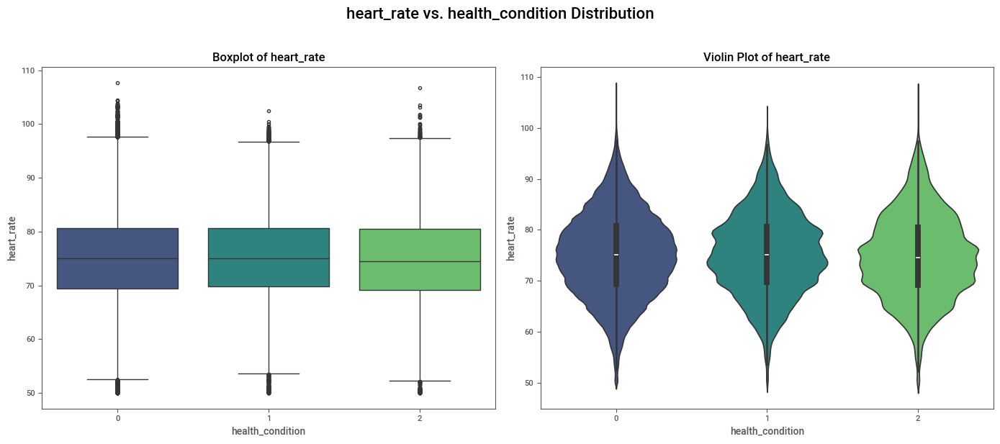

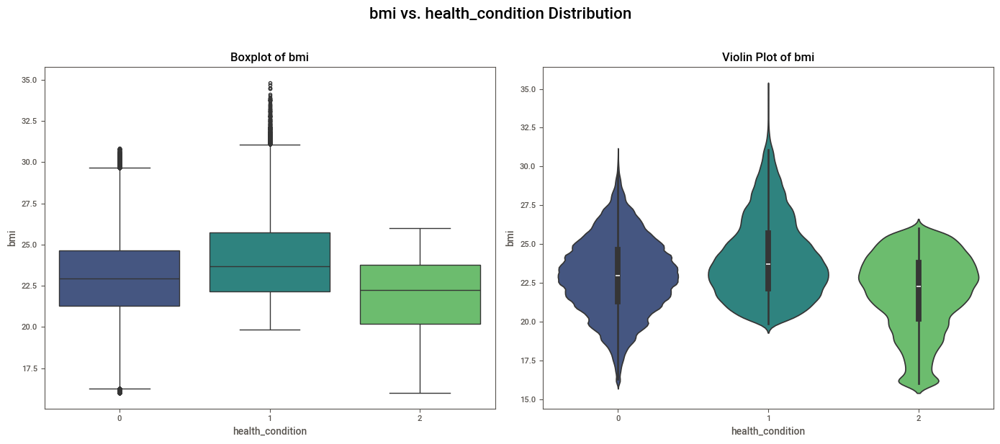

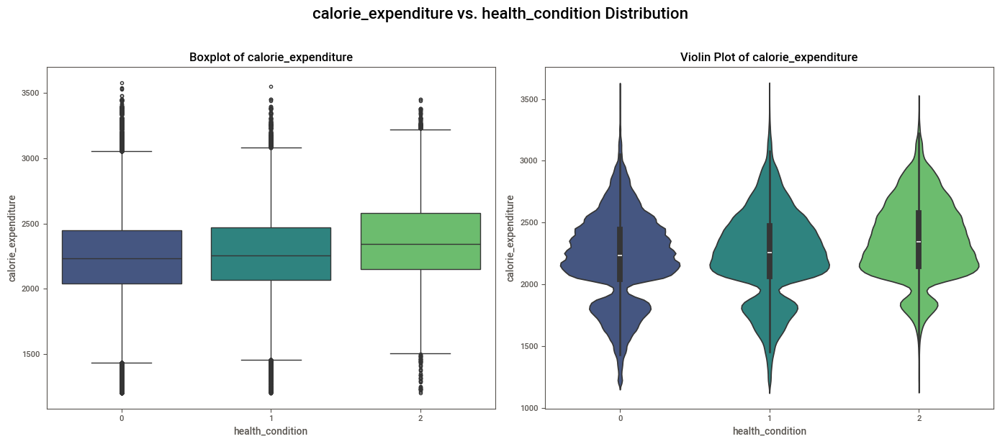

...

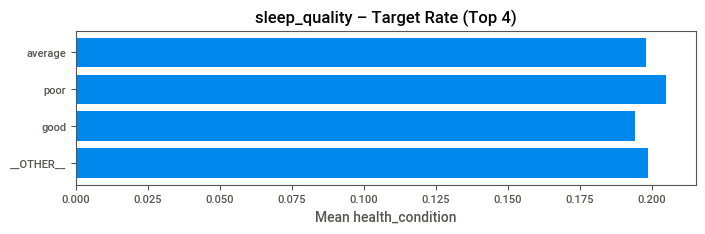

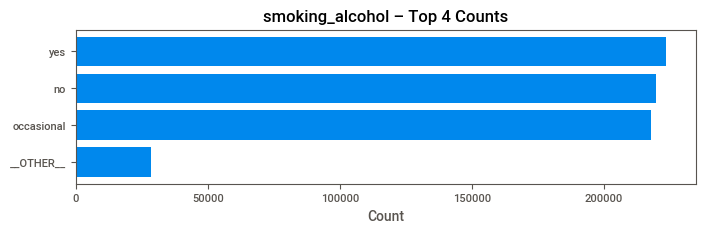

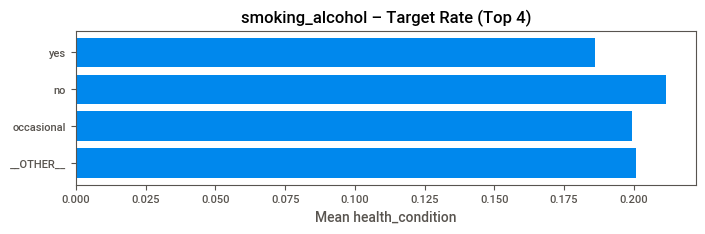

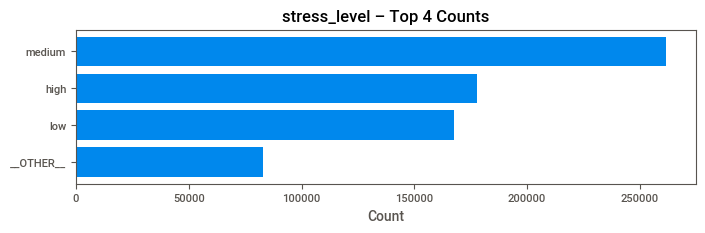

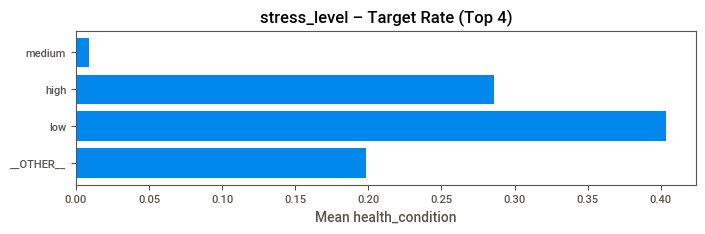

### Numeric x Category Trend

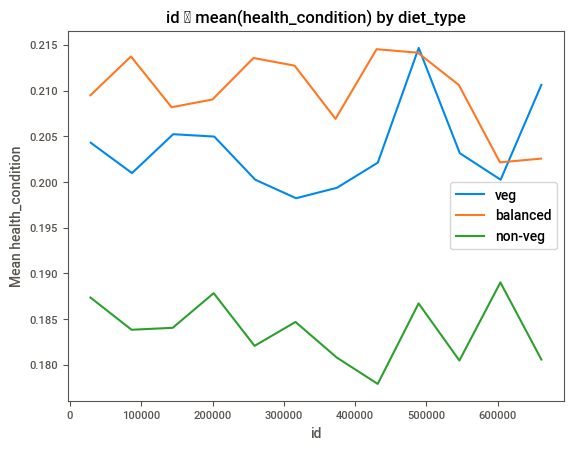

### Category x Category Trend

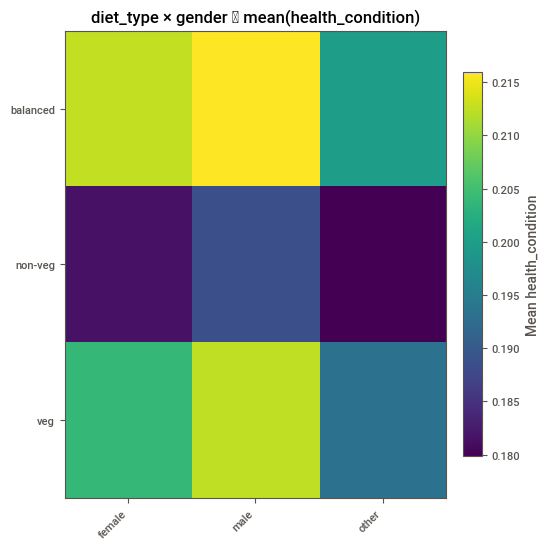

### Feature Signal Ranking

Top numeric (|Spearman|): [('sleep_duration', -0.14603118549197572), ('exercise_duration', 0.14536766436872095), ('step_count', 0.1439342359410289), ('calorie_expenditure', 0.07672015011653083), ('bmi', 0.016061347475343886), ('water_intake', -0.005515032681633326), ('heart_rate', -0.0038448902196911833), ('id', -0.0011113227752258923)]
Top categorical (range of mean risk): [('stress_level', 0.3948230036983371, 3), ('physical_activity_level', 0.3433756692476941, 3), ('diet_type', 0.026015356242249016, 3), ('smoking_alcohol', 0.025709152182238848, 3), ('gender', 0.014733184084925383, 3), ('sleep_quality', 0.011084340263533304, 3)]


In [11]:
# Define mapping for the target
# at-risk -> 0, unhealthy -> 1, fit -> 2 (not certain if this is appropriate for the task)
target_mapping = {'at-risk': 0, 'unhealthy': 1, 'fit': 2}

# Apply mapping to the target column
training_df[TARGET] = training_df[TARGET].map(target_mapping)

visualizer = DataVisualizer(target=TARGET, seed=helper.seed())
visualizer.run_data_visualization(training_df)


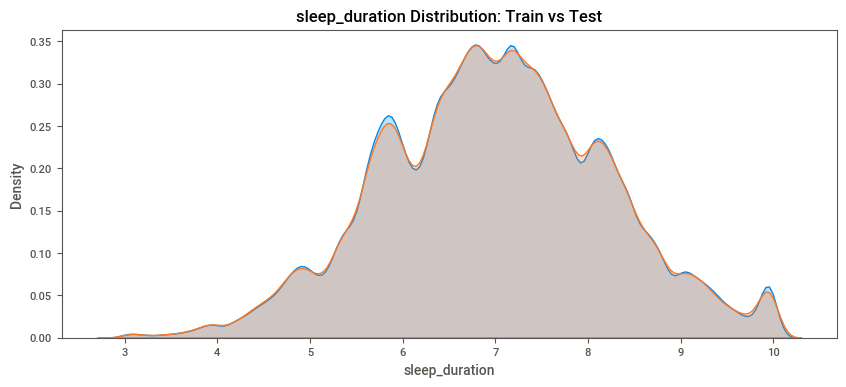

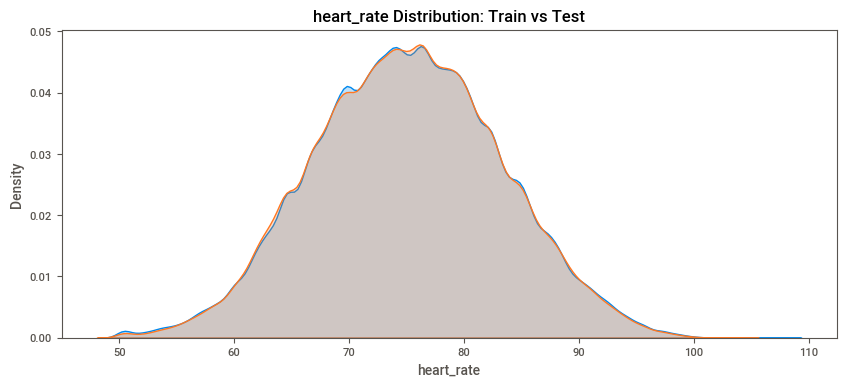

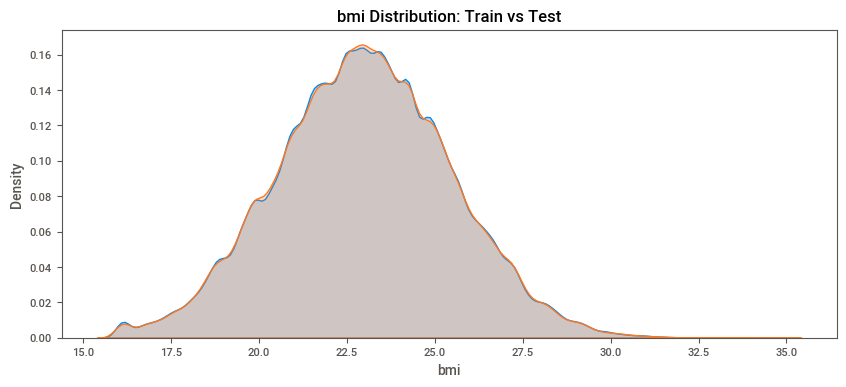

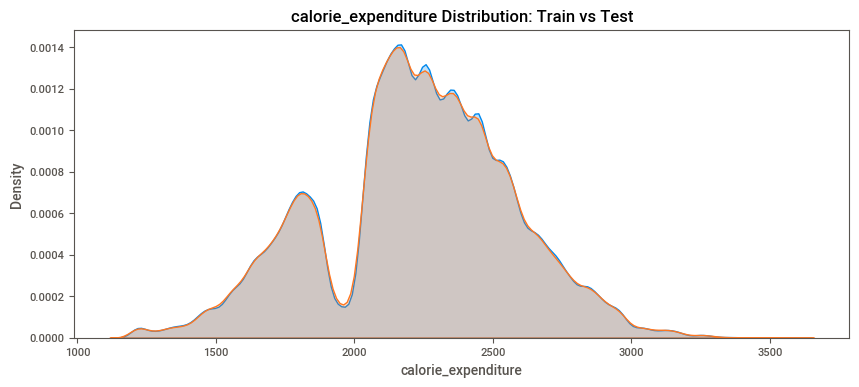

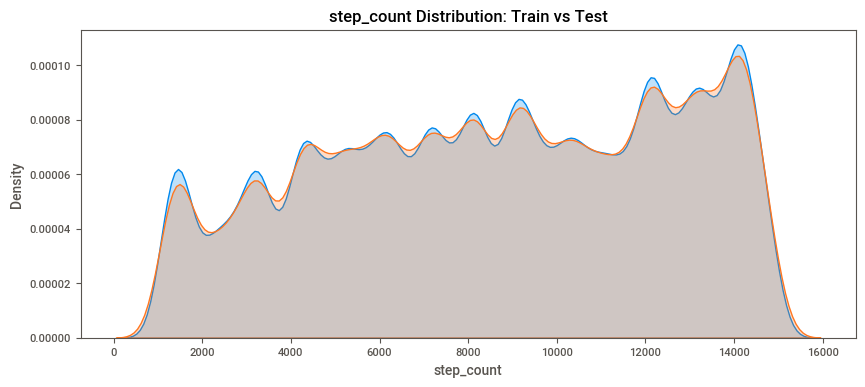

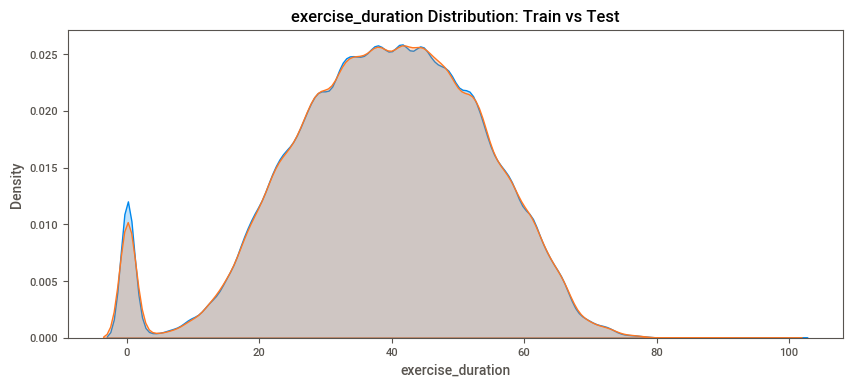

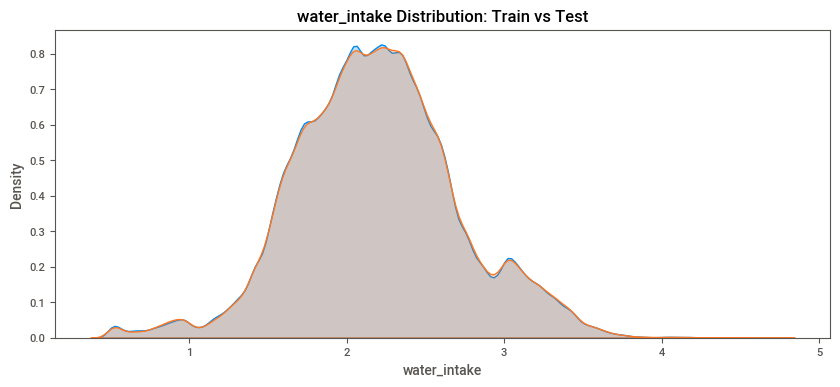

In [12]:
# Check for drift visually in numerical features
tops = [
    'sleep_duration',
    'heart_rate',
    'bmi',
    'calorie_expenditure',
    'step_count',
    'exercise_duration',
    'water_intake'
]
for top in tops:
    plt.figure(figsize=(10, 4))
    sns.kdeplot(training_df[top], label='Train', fill=True)
    sns.kdeplot(test_df[top], label='Test', fill=True)
    plt.title(f'{top} Distribution: Train vs Test')
    plt.show()
